<a href="https://www.kaggle.com/code/sambhavdixit/pneumonia-something-someting?scriptVersionId=126786488" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
#in case model doesnt work remove the shuffling block.


# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/.DS_Store
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/.DS_Store
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1947_bacteria_4876.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1946_bacteria_4875.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1952_bacteria_4883.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1954_bacteria_4886.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1951_bacteria_4882.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1946_bacteria_4874.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1949_bacteria_4880.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/.DS_Store
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/per

In [2]:
#GENERAL
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
#PATH PROCESS
import os
import os.path
from pathlib import Path
import glob
#IMAGE PROCESS
from PIL import Image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
#SCALER & TRANSFORMATION
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from keras.utils.np_utils import to_categorical
from sklearn.model_selection import train_test_split
from keras import regularizers
from sklearn.preprocessing import LabelEncoder
#ACCURACY CONTROL
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
#OPTIMIZER
from keras.optimizers import RMSprop,Optimizer,Optimizer
from tensorflow.keras.optimizers.legacy import Adam
#MODEL LAYERS
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization,MaxPooling2D,BatchNormalization,\
                        Permute, TimeDistributed, Bidirectional,GRU, SimpleRNN, LSTM, GlobalAveragePooling2D, SeparableConv2D
from keras import models
from keras import layers
import tensorflow as tf
from keras.applications import VGG19,inception_v3
from tensorflow.keras.applications.vgg16 import preprocess_input,decode_predictions
from keras import backend as K
from keras.utils import plot_model
#SKLEARN CLASSIFIER
from xgboost import XGBClassifier, XGBRegressor
from lightgbm import LGBMClassifier, LGBMRegressor
from catboost import CatBoostClassifier, CatBoostRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.neural_network import MLPClassifier, MLPRegressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.cross_decomposition import PLSRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import ElasticNetCV

#IGNORING WARNINGS
from warnings import filterwarnings
filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

In [3]:
CATEGORY = ['PNEUMONIA', 'NORMAL']
img_size = 150
def get_training_data(data_dir):
    data = [] 
    for cat in CATEGORY: 
        path = os.path.join(data_dir, cat)
        class_num = CATEGORY.index(cat)
        for img in os.listdir(path):
            try:
                img_arr = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
                resized_arr = cv2.resize(img_arr, (img_size, img_size)) # Reshaping images to preferred size
                data.append([resized_arr, class_num])
            except Exception as e:
                print(e)
    return np.array(data)

In [4]:
train_path = get_training_data('../input/chest-xray-pneumonia/chest_xray/chest_xray/train')
test_path = get_training_data('../input/chest-xray-pneumonia/chest_xray/chest_xray/test')
val_path = get_training_data('../input/chest-xray-pneumonia/chest_xray/chest_xray/val')

OpenCV(4.5.4) /tmp/pip-req-build-jpmv6t9_/opencv/modules/imgproc/src/resize.cpp:4051: error: (-215:Assertion failed) !ssize.empty() in function 'resize'

OpenCV(4.5.4) /tmp/pip-req-build-jpmv6t9_/opencv/modules/imgproc/src/resize.cpp:4051: error: (-215:Assertion failed) !ssize.empty() in function 'resize'

OpenCV(4.5.4) /tmp/pip-req-build-jpmv6t9_/opencv/modules/imgproc/src/resize.cpp:4051: error: (-215:Assertion failed) !ssize.empty() in function 'resize'

OpenCV(4.5.4) /tmp/pip-req-build-jpmv6t9_/opencv/modules/imgproc/src/resize.cpp:4051: error: (-215:Assertion failed) !ssize.empty() in function 'resize'



<AxesSubplot:ylabel='count'>

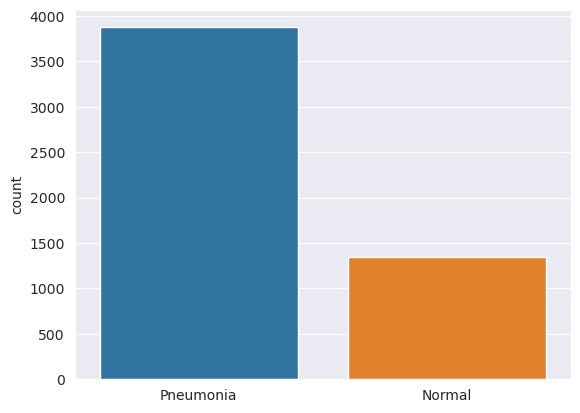

In [5]:
l = []
for i in train_path:
    if(i[1] == 0):
        l.append("Pneumonia")
    else:
        l.append("Normal")
sns.set_style('darkgrid')
sns.countplot(x=l)

<AxesSubplot:ylabel='count'>

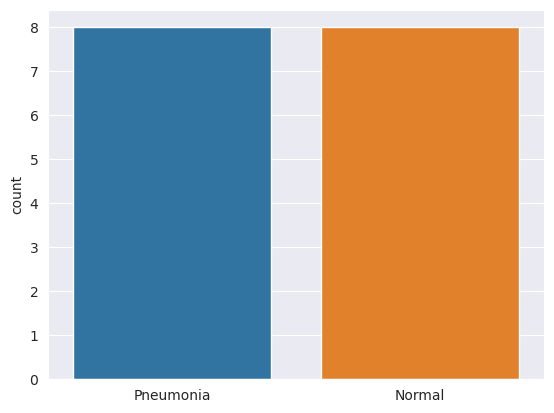

In [6]:
m = []
for i in val_path:
    if(i[1] == 0):
        m.append("Pneumonia")
    else:
        m.append("Normal")
sns.set_style('darkgrid')
sns.countplot(x=m)

<AxesSubplot:ylabel='count'>

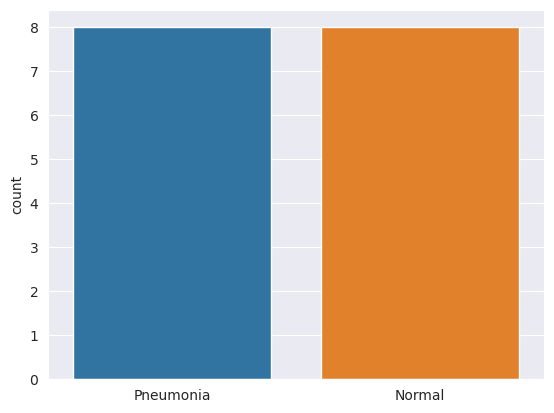

In [7]:
n = []
for i in val_path:
    if(i[1] == 0):
        n.append("Pneumonia")
    else:
        n.append("Normal")
sns.set_style('darkgrid')
sns.countplot(x=n)

In [8]:
# train_path['CATEGORY'].value_counts().plot.pie(figsize=(7,7))
# plt.show()

In [9]:
print(train_path)

[[array([[ 75,  72,  31, ..., 128, 166, 190],
         [ 60,  50,   0, ..., 127, 171, 196],
         [ 54,   8,   4, ..., 112, 155, 191],
         ...,
         [ 13,  13,  13, ..., 190, 192, 195],
         [ 13,  12,  13, ..., 190, 196, 197],
         [ 13,  12,  13, ..., 190, 193, 197]], dtype=uint8) 0]
 [array([[  2,   9,  33, ...,  52,  52,  44],
         [  1,  10,  30, ...,  52,  53,  42],
         [  1,   8,  32, ...,  49, 107,  42],
         ...,
         [  0,   0,   0, ..., 252,   1,   6],
         [  1,   0,   0, ...,   1,   2,   0],
         [  1,   0,   0, ...,   0,   0,   0]], dtype=uint8) 0]
 [array([[ 88, 124, 103, ..., 191, 105, 100],
         [ 88, 118,  98, ..., 108, 163, 123],
         [ 80, 116,  97, ..., 161, 168, 158],
         ...,
         [  9,  18,   4, ...,   4,   2,   5],
         [  2,   8,   3, ...,   6,   2,   3],
         [  7,  11,   8, ...,   5,   2,   3]], dtype=uint8) 0]
 ...
 [array([[40, 45, 54, ..., 40, 37, 38],
         [37, 42, 52, ..., 56, 51,

Text(0.5, 1.0, 'NORMAL')

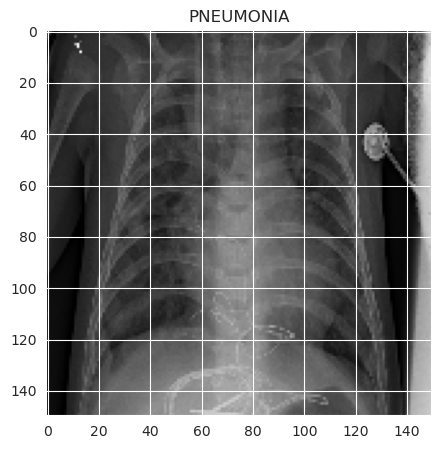

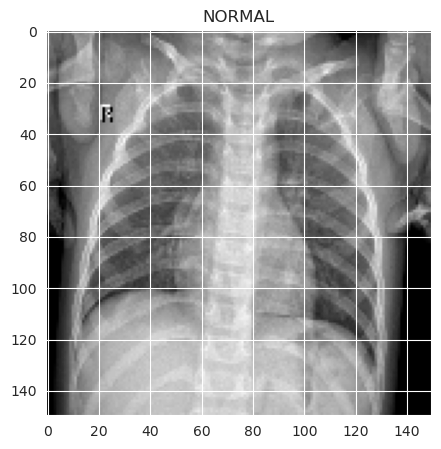

In [10]:
plt.figure(figsize = (5,5))
plt.imshow(train_path[0][0], cmap='gray')
plt.title(CATEGORY[train_path[0][1]])

plt.figure(figsize = (5,5))
plt.imshow(train_path[-1][0], cmap='gray')
plt.title(CATEGORY[train_path[-1][1]])

In [11]:
# #incase the model doesnt work remove this block
# train_path = np.random.shuffle(train_path)
# test_path = np.random.shuffle(test_path)
# val_path = np.random.shuffle(val_path)

In [12]:
xtrain = []
ytrain = []

xval = []
yval = []

xtest = []
ytest = []

for feature, label in train_path:
    xtrain.append(feature)
    ytrain.append(label)

for feature, label in test_path:
    xtest.append(feature)
    ytest.append(label)
    
for feature, label in val_path:
    xval.append(feature)
    yval.append(label)

In [13]:
xtrain = np.array(xtrain)/255
xval= np.array(xval)/255
xtest=np.array(xtest)/255

In [14]:
xtrain =xtrain.reshape(-1, img_size, img_size,1)
ytrain =np.array(ytrain).reshape((-1,1))

xval=xval.reshape(-1,img_size,img_size,1)
yval=np.array(yval).reshape((-1,1))

xtest=xtest.reshape(-1,img_size,img_size,1)
ytest=np.array(ytest).reshape((-1,1))

In [15]:
syngen=ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range = 30,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.2, # Randomly zoom image 
        width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
        horizontal_flip = True,  # randomly flip images
        vertical_flip=False)  # randomly flip images

syngen.fit(xtrain)

In [16]:
Call_Back_Early =tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', patience = 2, verbose=1,factor=0.3, min_lr=0.000001)

In [17]:
Model_One = Sequential()
Model_One.add(Conv2D(32 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu' , input_shape = (150,150,1)))
Model_One.add(BatchNormalization())
Model_One.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))
Model_One.add(Conv2D(64 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
Model_One.add(Dropout(0.1))
Model_One.add(BatchNormalization())
Model_One.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))
Model_One.add(Conv2D(64 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
Model_One.add(BatchNormalization())
Model_One.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))
Model_One.add(Conv2D(128 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
Model_One.add(Dropout(0.2))
Model_One.add(BatchNormalization())
Model_One.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))
Model_One.add(Conv2D(256 , (3,3) , strides = 1 , padding = 'same' , activation = 'relu'))
Model_One.add(Dropout(0.2))
Model_One.add(BatchNormalization())
Model_One.add(MaxPool2D((2,2) , strides = 2 , padding = 'same'))
Model_One.add(Flatten())
Model_One.add(Dense(units = 128 , activation = 'relu'))
Model_One.add(Dropout(0.2))
Model_One.add(Dense(units = 1 , activation = 'sigmoid'))
Model_One.compile(optimizer = "rmsprop" , loss = 'binary_crossentropy' , metrics = ['accuracy'])
Model_One.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 150, 32)      320       
                                                                 
 batch_normalization (BatchN  (None, 150, 150, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 75, 75, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 75, 75, 64)        18496     
                                                                 
 dropout (Dropout)           (None, 75, 75, 64)        0         
                                                                 
 batch_normalization_1 (Batc  (None, 75, 75, 64)       2

In [18]:
CNN_Model_One = Model_One.fit(syngen.flow(xtrain,ytrain, batch_size = 32) ,epochs = 12 , validation_data = syngen.flow(xval, yval) ,callbacks = [Call_Back_Early])

Epoch 1/12
163/163 [==============================] - 213s 1s/step - loss: 0.4679 - accuracy: 0.8441 - val_loss: 28.4981 - val_accuracy: 0.5000 - lr: 0.0010
Epoch 2/12
163/163 [==============================] - 209s 1s/step - loss: 0.2599 - accuracy: 0.8984 - val_loss: 39.7116 - val_accuracy: 0.5000 - lr: 0.0010
Epoch 3/12
163/163 [==============================] - ETA: 0s - loss: 0.2325 - accuracy: 0.9158
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.
163/163 [==============================] - 209s 1s/step - loss: 0.2325 - accuracy: 0.9158 - val_loss: 43.2826 - val_accuracy: 0.5000 - lr: 0.0010
Epoch 4/12
163/163 [==============================] - 209s 1s/step - loss: 0.1632 - accuracy: 0.9427 - val_loss: 15.5465 - val_accuracy: 0.5000 - lr: 3.0000e-04
Epoch 5/12
163/163 [==============================] - ETA: 0s - loss: 0.1430 - accuracy: 0.9503
Epoch 5: ReduceLROnPlateau reducing learning rate to 9.000000427477062e-05.
163/163 [==========================

In [34]:
Model_One.save('/kaggle/working/model.h5')

In [35]:
Model_Results = Model_One.evaluate(xtest,ytest)
print("LOSS:  " + "%.4f" % Model_Results[0])
print("ACCURACY:  " + "%.2f" % Model_Results[1] ,"%")

20/20 [==============================] - 6s 300ms/step - loss: 0.3614 - accuracy: 0.8558
LOSS:  0.3614
ACCURACY:  0.86 %


In [36]:
# Model_One.save("/kaggle/working/model")

In [37]:
# from transformers import AutoModel
# model = AutoModel.from_pretrained("./model")

In [38]:
# from huggingface_hub import notebook_login

In [39]:
# notebook_login()

In [40]:
# Model_One.push_to_hub("Sambhavnoobcoder/pneumonia-x-ray-detection")

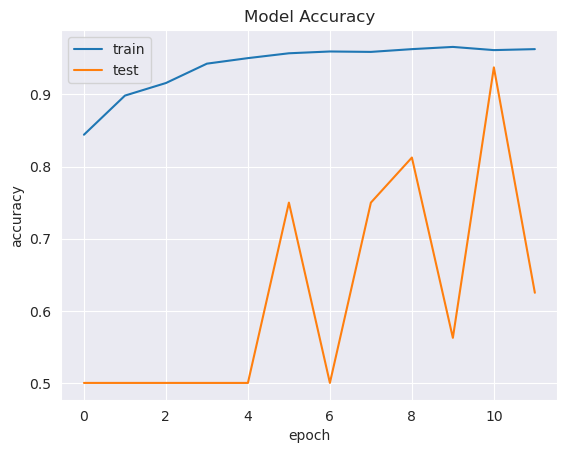

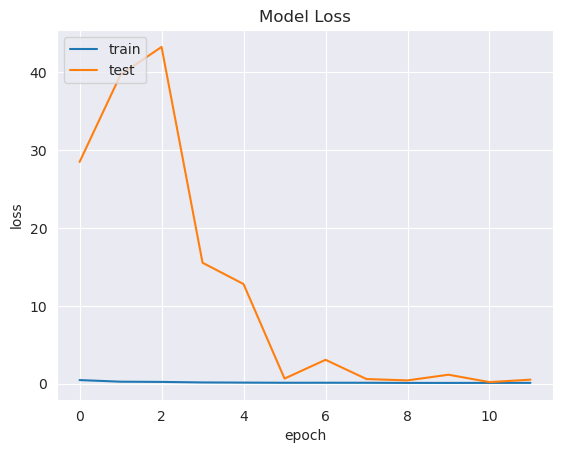

In [41]:
plt.plot(CNN_Model_One.history['accuracy'])
plt.plot(CNN_Model_One.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

plt.plot(CNN_Model_One.history['loss'])
plt.plot(CNN_Model_One.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

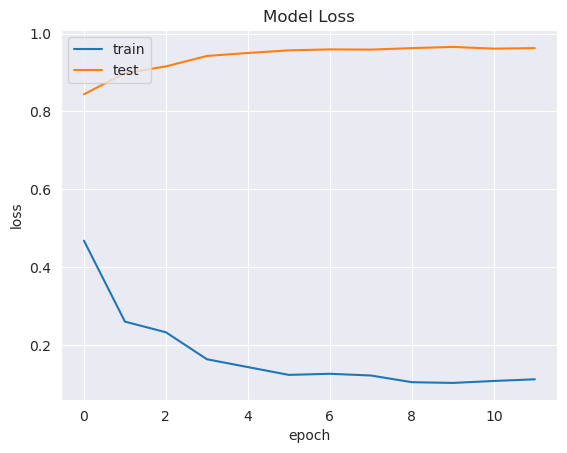

In [42]:
plt.plot(CNN_Model_One.history['loss'])
plt.plot(CNN_Model_One.history['accuracy'])
plt.title('Model Loss')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [43]:
Model_Two = tf.keras.models.Sequential([
  # inputs 
  tf.keras.layers.experimental.preprocessing.Rescaling(1./255),
  tf.keras.layers.Flatten(input_shape=(113,)),
  # hiddens layers
    tf.keras.layers.Dense(10, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  # output layer
  tf.keras.layers.Dense(2,activation="softmax")
])

In [44]:
lossfunc = tf.keras.losses.CategoricalCrossentropy(from_logits=True)

In [45]:
Model_Two.compile(optimizer='adam', loss=lossfunc, metrics=['accuracy'])

In [46]:
ANN_Model_One = Model_Two.fit(syngen.flow(xtrain,ytrain, batch_size = 50) ,epochs = 12 , validation_data = syngen.flow(xval, yval) ,callbacks = [Call_Back_Early])

Epoch 1/12
105/105 [==============================] - 11s 95ms/step - loss: 0.3633 - accuracy: 0.9576 - val_loss: 0.7107 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 2/12
105/105 [==============================] - 10s 93ms/step - loss: 0.3735 - accuracy: 0.8623 - val_loss: 0.7348 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 3/12
105/105 [==============================] - ETA: 0s - loss: 0.4129 - accuracy: 0.7968
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.
105/105 [==============================] - 10s 93ms/step - loss: 0.4129 - accuracy: 0.7968 - val_loss: 0.8156 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 4/12
105/105 [==============================] - 10s 93ms/step - loss: 0.4846 - accuracy: 0.8020 - val_loss: 0.7945 - val_accuracy: 1.0000 - lr: 3.0000e-04
Epoch 5/12
105/105 [==============================] - ETA: 0s - loss: 0.5056 - accuracy: 0.8046
Epoch 5: ReduceLROnPlateau reducing learning rate to 9.000000427477062e-05.
105/105 [==========================

In [47]:
Model_Results_Two = Model_Two.evaluate(xtest,ytest)
print("LOSS:  " + "%.4f" % Model_Results_Two[0])
print("ACCURACY:  " + "%.2f" % Model_Results_Two[1])

20/20 [==============================] - 0s 4ms/step - loss: 0.5833 - accuracy: 1.0000
LOSS:  0.5833
ACCURACY:  1.00


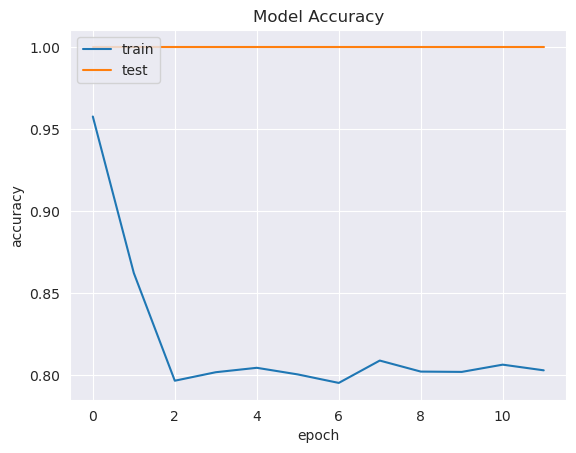

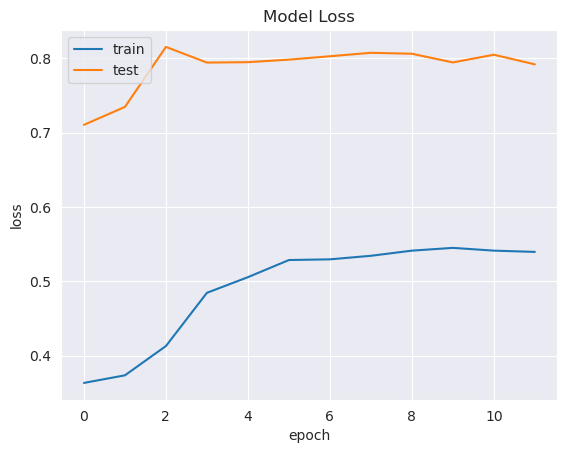

In [48]:
plt.plot(ANN_Model_One.history['accuracy'])
plt.plot(ANN_Model_One.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

plt.plot(ANN_Model_One.history['loss'])
plt.plot(ANN_Model_One.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

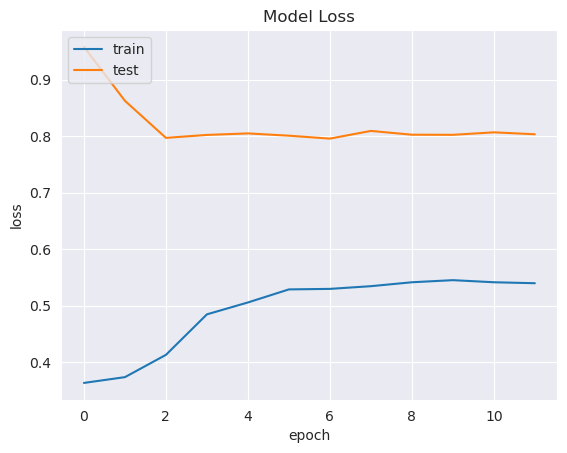

In [49]:
plt.plot(ANN_Model_One.history['loss'])
plt.plot(ANN_Model_One.history['accuracy'])
plt.title('Model Loss')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [50]:
Prediction_One = Model_One.predict(xtest)
# Prediction_One = Prediction_One.argmax(axis=-1)

20/20 [==============================] - 6s 295ms/step


In [51]:
print(Prediction_One)

[[8.67930472e-01]
 [1.42673060e-01]
 [6.52954459e-01]
 [5.65141889e-08]
 [3.18743382e-03]
 [8.14959466e-01]
 [1.09349236e-01]
 [2.40836665e-02]
 [1.78669885e-01]
 [7.54819065e-02]
 [8.56314063e-01]
 [9.63679910e-01]
 [1.24092333e-01]
 [1.25887062e-04]
 [5.38554089e-03]
 [6.50350526e-02]
 [1.29697681e-03]
 [7.95886755e-01]
 [7.18927026e-01]
 [1.25349713e-02]
 [5.50748069e-09]
 [1.61198604e-05]
 [9.94150758e-01]
 [1.52765587e-03]
 [6.84039760e-03]
 [1.31342664e-01]
 [3.77656259e-02]
 [6.13228343e-02]
 [5.32707374e-04]
 [1.82291925e-01]
 [1.54525712e-01]
 [5.92446446e-01]
 [9.74758744e-01]
 [6.76392794e-01]
 [2.13740751e-01]
 [5.35329223e-01]
 [2.30275001e-03]
 [1.39432508e-04]
 [4.62326534e-06]
 [9.34422553e-01]
 [1.60988861e-07]
 [2.44886323e-05]
 [2.17923708e-02]
 [5.62044140e-03]
 [9.57156658e-01]
 [5.07692695e-01]
 [5.06150484e-01]
 [3.22935246e-02]
 [2.48264754e-03]
 [9.60911158e-03]
 [1.10896870e-01]
 [8.55980325e-05]
 [1.69205382e-01]
 [2.42471401e-07]
 [4.78415473e-07]
 [5.957895

In [52]:
predictions = np.argmax(Model_One.predict(xtest),axis=1)
predictions = predictions.reshape(1,-1)[0]

20/20 [==============================] - 6s 297ms/step


In [53]:
print(classification_report(ytest, predictions, target_names = ['Pneumonia (Class 0)','Normal (Class 1)']))

                     precision    recall  f1-score   support

Pneumonia (Class 0)       0.62      1.00      0.77       390
   Normal (Class 1)       0.00      0.00      0.00       234

           accuracy                           0.62       624
          macro avg       0.31      0.50      0.38       624
       weighted avg       0.39      0.62      0.48       624



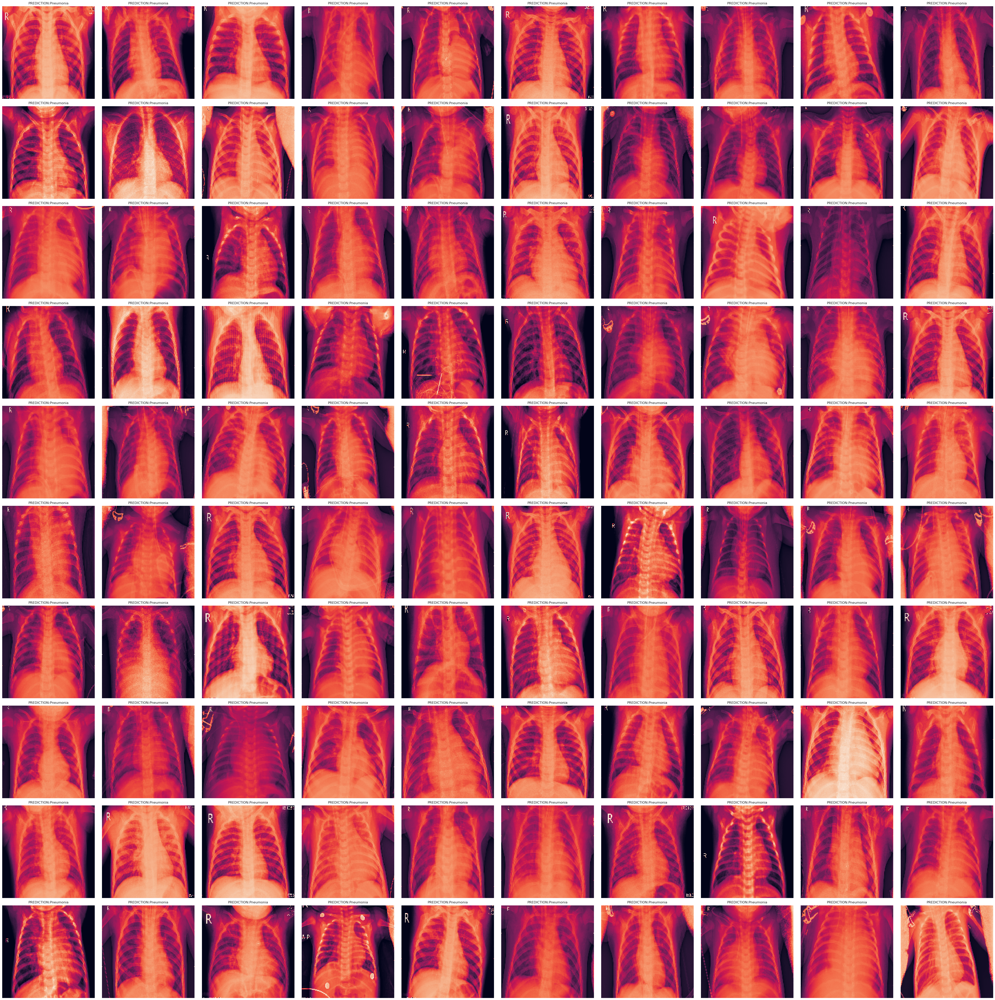

In [54]:
fig, axes = plt.subplots(nrows=10,
                         ncols=10,
                         figsize=(50, 50),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(xtest[i])
    x="o"
    if predictions[i]==0:
        x="Pneumonia"
    elif predictions[i]==1:
        x="Normal"
    ax.set_title(f"PREDICTION:{x}")
plt.tight_layout()
plt.show()